In [1]:
import cv2
import numpy as np
import math
import matplotlib.pyplot as plt

In [2]:
def show_images(images, size=(16, 8), mode='rgb', image_type=None, grid=None, title=(None,None), fig_suptitle=None): 
        if not isinstance(images, tuple) and not isinstance(images, list):
            images = [images]
            title = [title]

        if isinstance(mode, tuple) or isinstance(mode, list):
            change_mode = True
        else:
            current_mode = mode
            change_mode = False
        
        if isinstance(image_type, tuple) or isinstance(image_type, list):
            change_mode_type = True
        else:
            current_mode_type = image_type
            change_mode_type = False
        
        if not grid:
            grid = []
            grid.append(math.ceil(len(images) / 2))
            grid.append(3)
            
        fig=plt.figure(figsize=size, dpi=150)
        for i, img in enumerate(images):
            fig.add_subplot(grid[0], grid[1], i+1)

            if change_mode:
                current_mode = mode[i]
            if change_mode_type:
                current_mode_type = image_type[i]

            if current_mode=='grayscale':
                if current_mode_type=='spectrum':
                    plt.imshow(np.abs(img)**(0.1), cmap='gray')
                else:
                    plt.imshow(img, cmap='gray')
            else:
                if current_mode_type=='spectrum':
                    plt.imshow(np.abs(img)**(0.1))
                else:
                    plt.imshow(img)
                    
            if title[i] is not None:
                plt.title(title[i])
            plt.axis('off')
        fig.suptitle(fig_suptitle, fontsize=16)
        plt.show()

In [3]:
class ImageTransformation:
    """A set of filters and image helper functions"""
    def __init__(self, image):
        self.cv_img = image
        self.width, self.height = image.shape
        
        
    ####### Helper functions #######
    def count_distance(self, u, v, width, height):
        return ((((u - width / 2) ** 2) + 
                  (v - height / 2) ** 2) ** (0.5))
    
    
    def calculate_spectrum(self):
        # Быстрое преобразование Фурье
        fft = np.fft.fft2(self.cv_img)
        fft_shift = np.fft.fftshift(fft)
        return fft_shift

    
    def mask_spectrum(self, spectrum, filt):
        filt_allpied = spectrum * filt
        f_ishift = np.fft.ifftshift(filt_allpied)
        # Вычисление двумерное обратное дискретное преобразование Фурье.
        img_ifft = np.fft.ifft2(f_ishift)
        return filt_allpied, img_ifft

        
    def normilize_image(self, image, mul_const=255.0):
        np_img = np.abs(image)
        return (mul_const * (np_img-np_img.min()) / 
                   (np_img.max() - np_img.min())
               ).astype('int')
    
    
    ####### Ideal filter #######
    def ideal_low_pass_filter(self, D_0):
        ideal_low = np.zeros((self.height, self.width), 
                             np.float32)
        
        for w in range(self.width):
            for h in range(self.height):
                if self.count_distance(w, h, self.width, self.height) <= D_0:
                    ideal_low[w][h] = 1          
        return ideal_low
    
    
    def ideal_high_pass_filter(self, D_0):
        ideal_high = np.zeros((self.height, self.width), 
                              np.float32)
        
        for w in range(self.width):
            for h in range(self.height):
                if self.count_distance(w, h, self.width, self.height) > D_0:
                    ideal_high[w][h] = 1         
        return ideal_high
    
    ####### Batervort filter #######
    def batervort_helper(self, w, h, width, height, D_0, n):
        return 1 / (
            (1 + self.count_distance(w, h, width, height) / D_0) ** (2*n)
        )
    
    
    def batervort_low_pass_filter(self, D_0, n):
        batervort_low = np.zeros(
            (self.height, self.width),
            np.float32
        )
        
        for w in range(self.width):
            for h in range(self.height):
                batervort_low[w][h] = self.batervort_helper(
                    w, h, self.width, 
                    self.height, D_0, n)   
        return batervort_low


    def batervort_high_pass_filter(self, D_0, n):
        batervort_high = np.zeros(
            (self.height, self.width), 
            np.float32
        )
        
        for w in range(self.width):
            for h in range(self.height):
                batervort_high[w][h] = 1 - self.batervort_helper(w, h, self.width, 
                                                                  self.height, D_0, n)
        return batervort_high
    
    
    ####### Gauss filter #######
    def gauss_helper(self, x, y, width, height, d):
        return math.exp((-1 * self.count_distance(x, y, width, 
                                                  height) ** 2) / d)
    
    
    def gauss_low_pass_filter(self, D_0):
        gauss_low = np.zeros(
            (self.width, self.height), 
            np.float32
        )
        
        for w in range(self.width):
            for h in range(self.height):
                d = D_0 ** 2
                d *= 2
                gauss_low[w][h] = self.gauss_helper(w, h, self.width, 
                                                     self.height, d)
        return gauss_low
    
    
    def gauss_high_pass_filter(self, D_0):
        gauss_high = np.zeros(
            (self.width, self.height), 
            np.float32
        )
        
        for w in range(self.width):
            for h in range(self.height):
                d = D_0 ** 2
                d *= 2
                gauss_high[w][h] = 1 - self.gauss_helper(w, h, self.width, 
                                                          self.height, d)
        return gauss_high
    

In [4]:
def apply_filter(d_arr, filter_func, n_val=None):
    filter_arr = []
    spectrum_back_filter_arr = []
    img_back_filter_arr = []

    for D in d_arr:
        # Для перебора значений n при фильтре Баттерворта
        if n_val:
            filter_applied = filter_func(D, n)
        else :
            filter_applied = filter_func(D)
        spectrum_back_filter, img_back_filter = image_transform.mask_spectrum(
                            spectrum, filter_applied
                        )
        
        filter_arr.append(filter_applied)
        spectrum_back_filter_arr.append(spectrum_back_filter)
        img_back_filter_arr.append(
            image_transform.normilize_image(
                img_back_filter
            )
        )
    return filter_arr, spectrum_back_filter_arr, img_back_filter_arr

In [5]:
def show_applied_filter3x5(images, titles, fig_suptitle, size=(16,10), grid=(3,5), mode='grayscale'):
    titles = 3 * titles
    image_types = 10 * ['spectrum'] + 5 * ['img']

    show_images(images,
                size=(16,10),
                grid=(3,5),
                mode='grayscale', 
                image_type = image_types,
                title=titles, 
                fig_suptitle=fig_suptitle)

In [6]:
img = cv2.imread('image.png', 0)
image_transform = ImageTransformation(img)

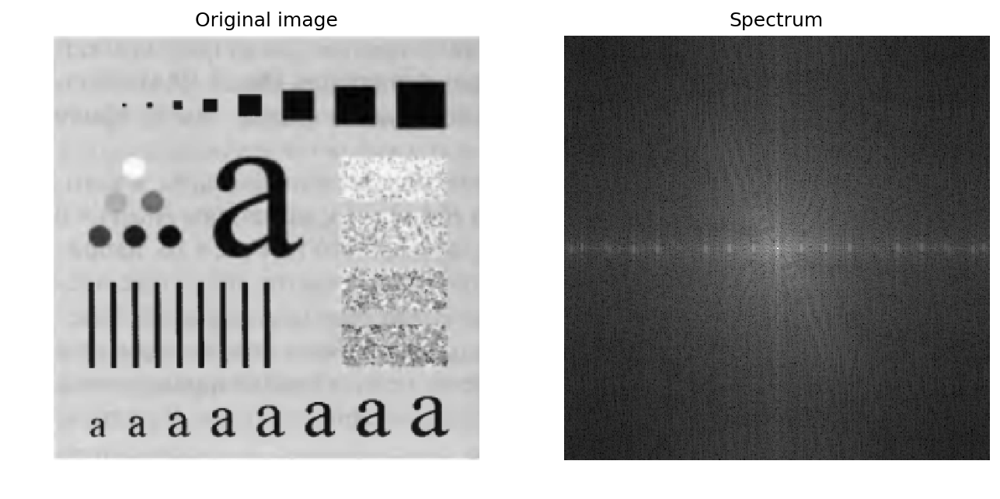

In [7]:
spectrum = image_transform.calculate_spectrum()
show_images([img, spectrum], 
            mode='grayscale', 
            grid=(1, 3), 
            title=('Original image', 'Spectrum'), 
            image_type=(None, 'spectrum'))

# Ideal Low Pass Filter

In [8]:
filter_arr_ILPF, spectrum_back_filter_arr_ILPF, img_back_filter_arr_ILPF = apply_filter([5, 15, 30, 80, 230], 
                                   image_transform.ideal_low_pass_filter)

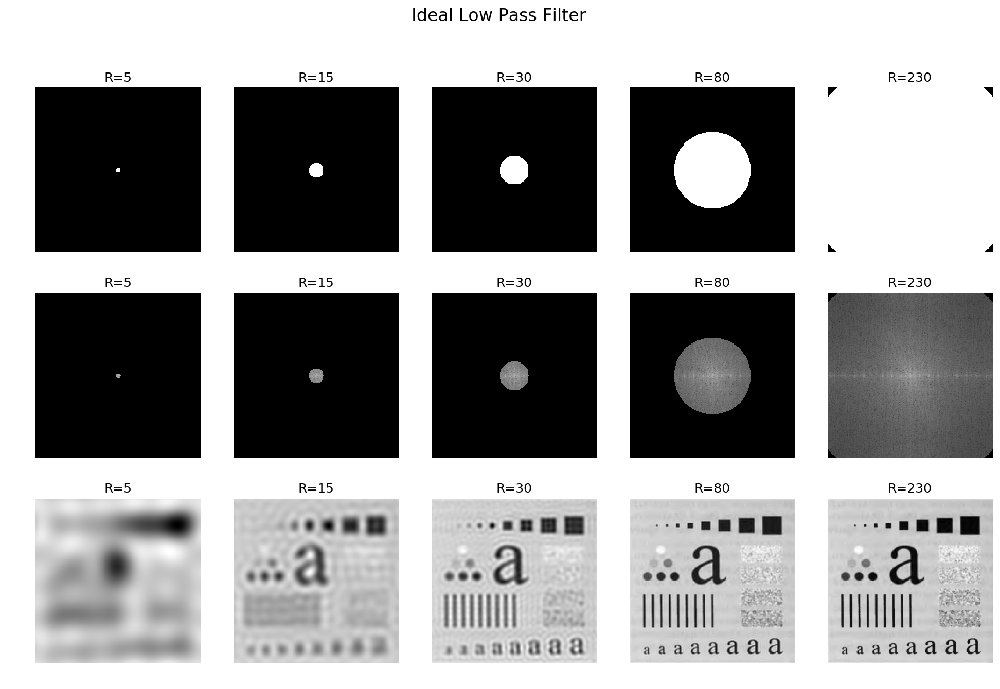

In [9]:
images = []
images = filter_arr_ILPF + spectrum_back_filter_arr_ILPF + img_back_filter_arr_ILPF
show_applied_filter3x5(images, ['R=5','R=15','R=30','R=80','R=230'], fig_suptitle='Ideal Low Pass Filter')

# Ideal High Pass Filter

In [10]:
filter_arr_IHPF, spectrum_back_filter_arr_IHPF, img_back_filter_arr_IHPF = apply_filter([5, 15, 30, 80, 230], 
                                   image_transform.ideal_high_pass_filter)

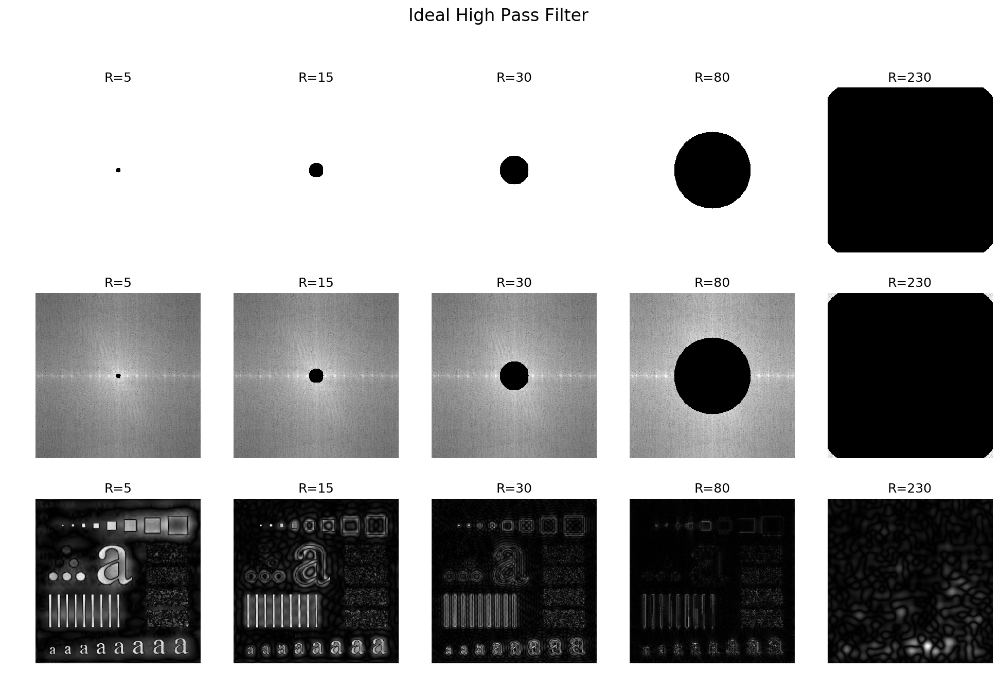

In [11]:
images = []
images = filter_arr_IHPF + spectrum_back_filter_arr_IHPF + img_back_filter_arr_IHPF
show_applied_filter3x5(images, ['R=5','R=15','R=30','R=80','R=230'], fig_suptitle='Ideal High Pass Filter')

# Butterword Low Pass filter

In [12]:
n_arr = [1, 2, 5, 20]

n_batervort_filter_arr = []
for n in n_arr:
    filter_arr_BLPF, spectrum_back_filter_arr_BLPF, img_back_filter_arr_BLPF = apply_filter([5, 15, 30, 80, 230], 
                                image_transform.batervort_low_pass_filter, n_val=n,)
    
    n_batervort_filter_arr.append([filter_arr_BLPF, 
                                   spectrum_back_filter_arr_BLPF, 
                                   img_back_filter_arr_BLPF])

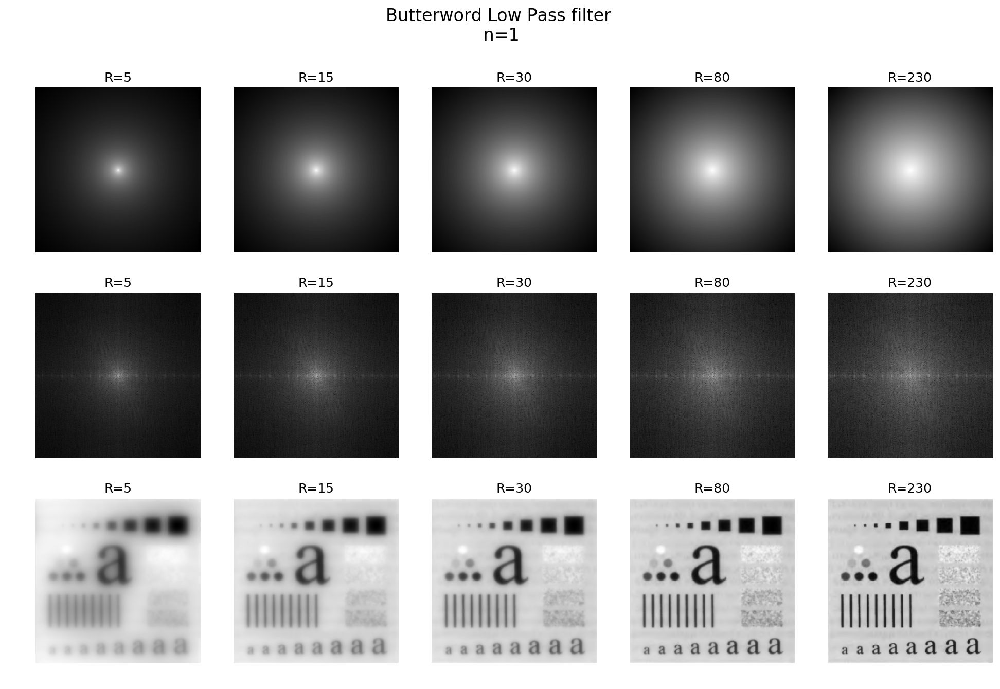

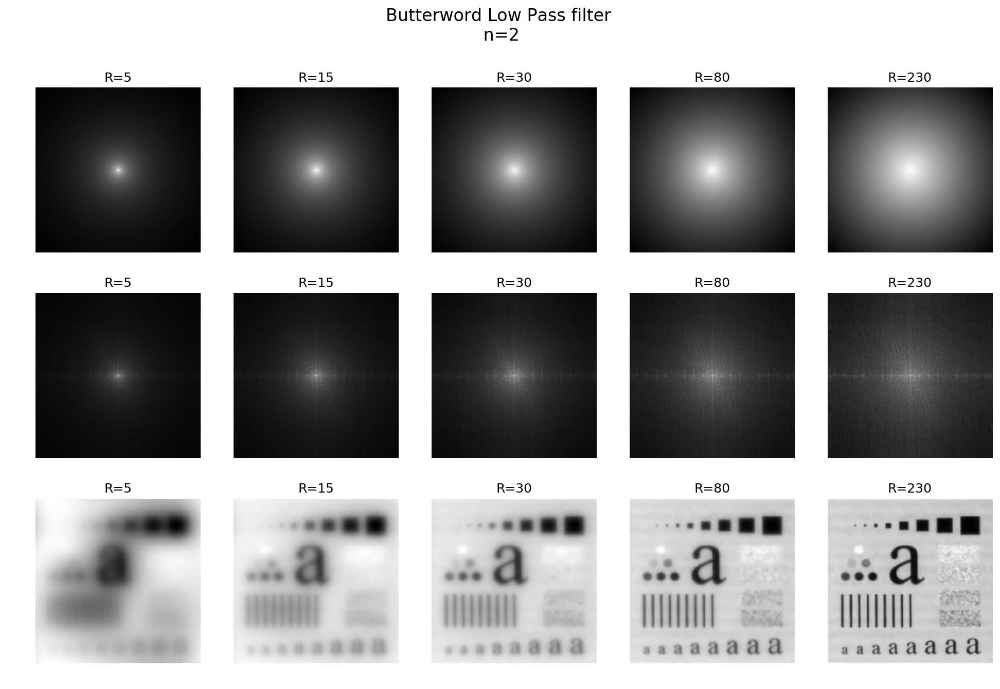

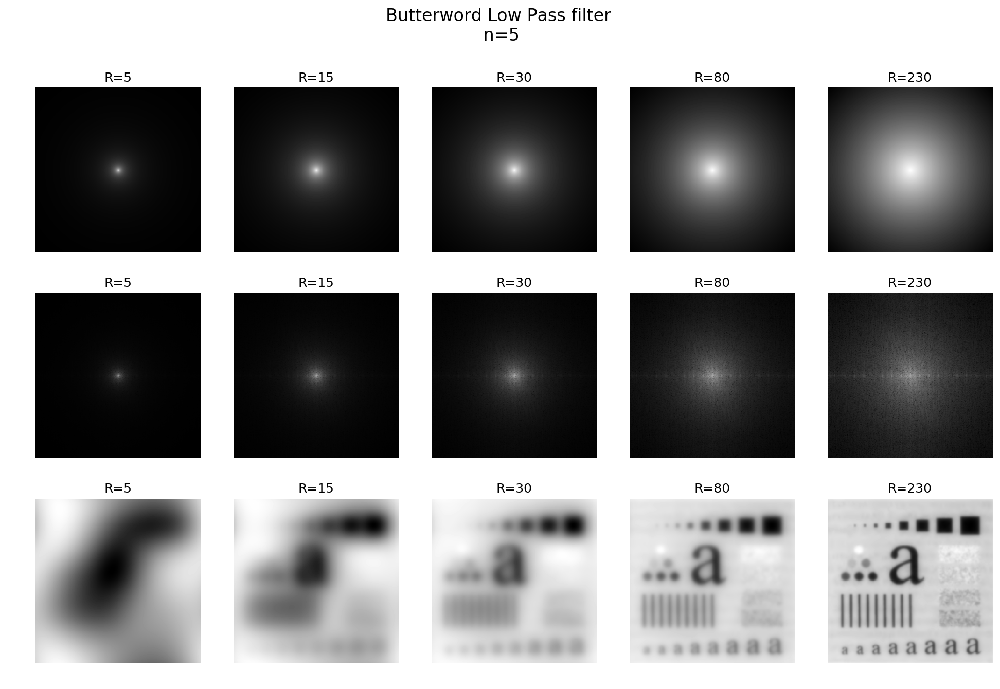

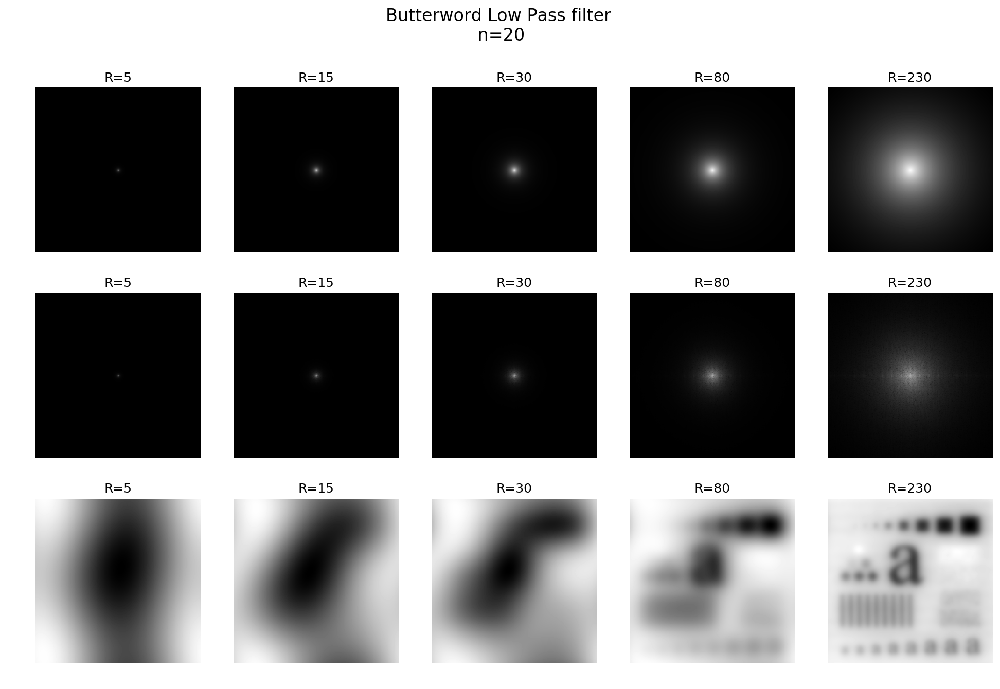

In [13]:
for i, n_batervort_filter in enumerate(n_batervort_filter_arr):
    images = []
    images = n_batervort_filter[0] + n_batervort_filter[1] + n_batervort_filter[2]
    show_applied_filter3x5(images, ['R=5','R=15','R=30','R=80','R=230'], 
                           fig_suptitle=f"Butterword Low Pass filter\n n={n_arr[i]}")

# Butterword High Pass filter

In [14]:
n_arr = [1, 2, 5, 20]

n_batervort_filter_arr = []
for n in n_arr:
    filter_arr_BHPF, spectrum_back_filter_arr_BHPF, img_back_filter_arr_BHPF = apply_filter([5, 15, 30, 80, 230], 
                                image_transform.batervort_high_pass_filter, n_val=n,)
    
    n_batervort_filter_arr.append([filter_arr_BHPF, 
                                   spectrum_back_filter_arr_BHPF, 
                                   img_back_filter_arr_BHPF])

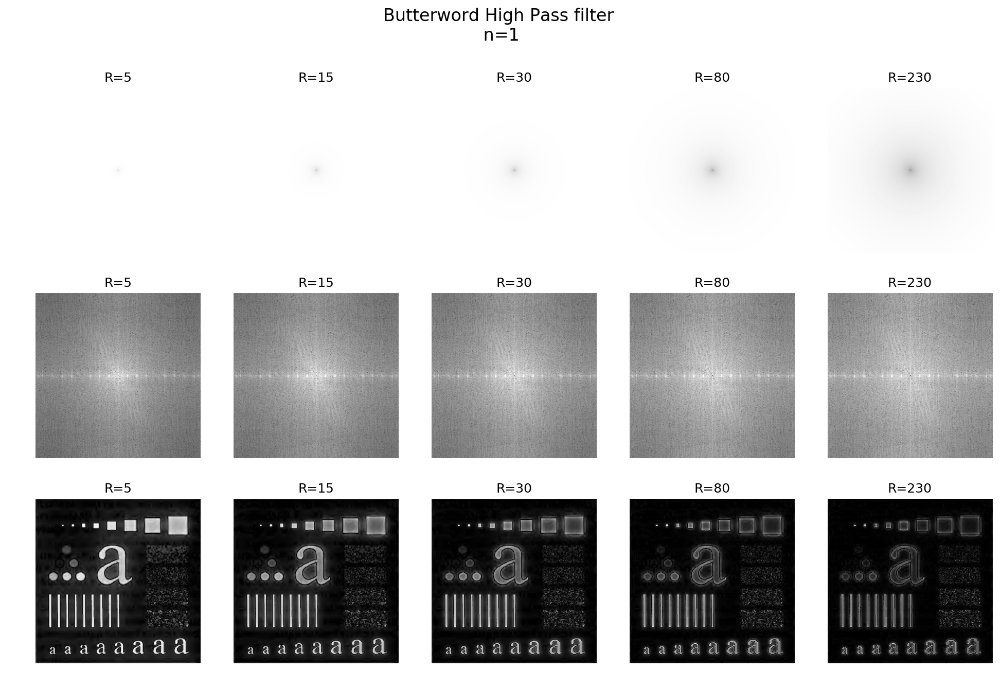

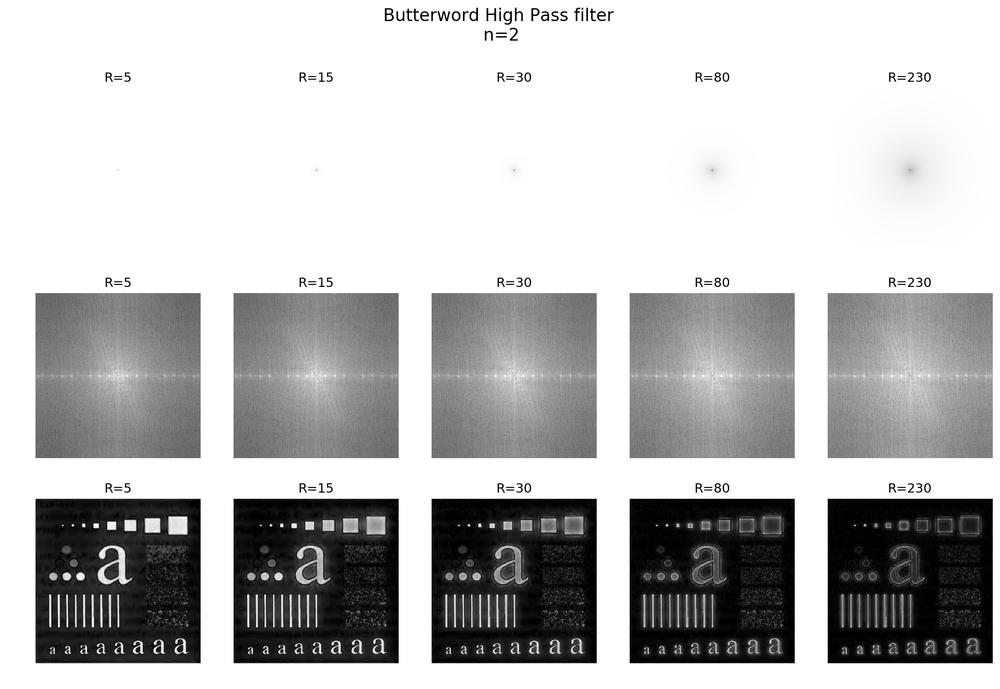

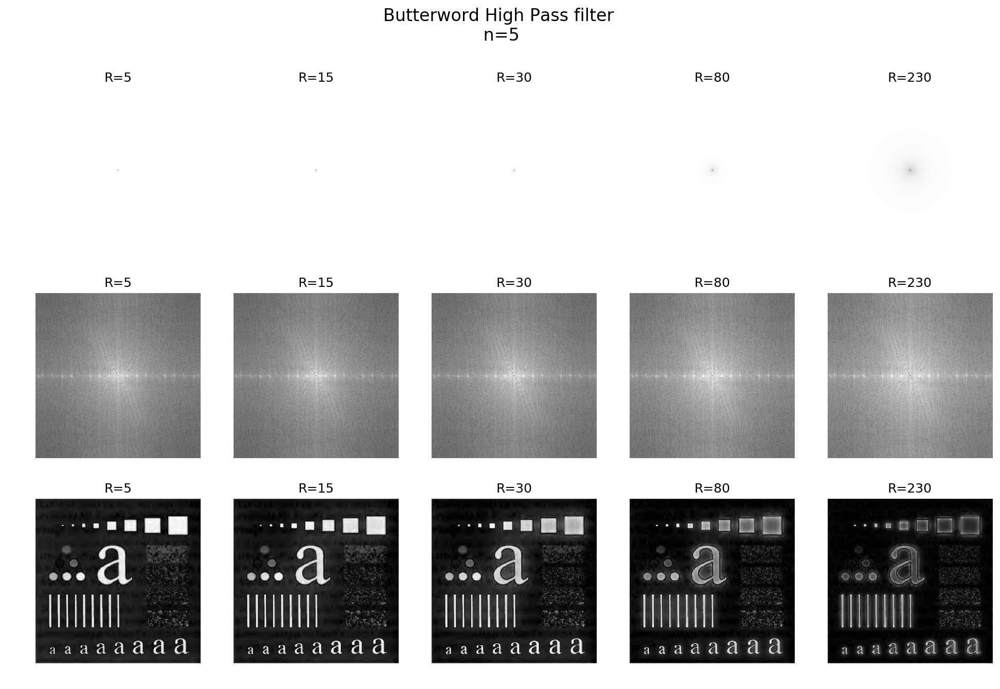

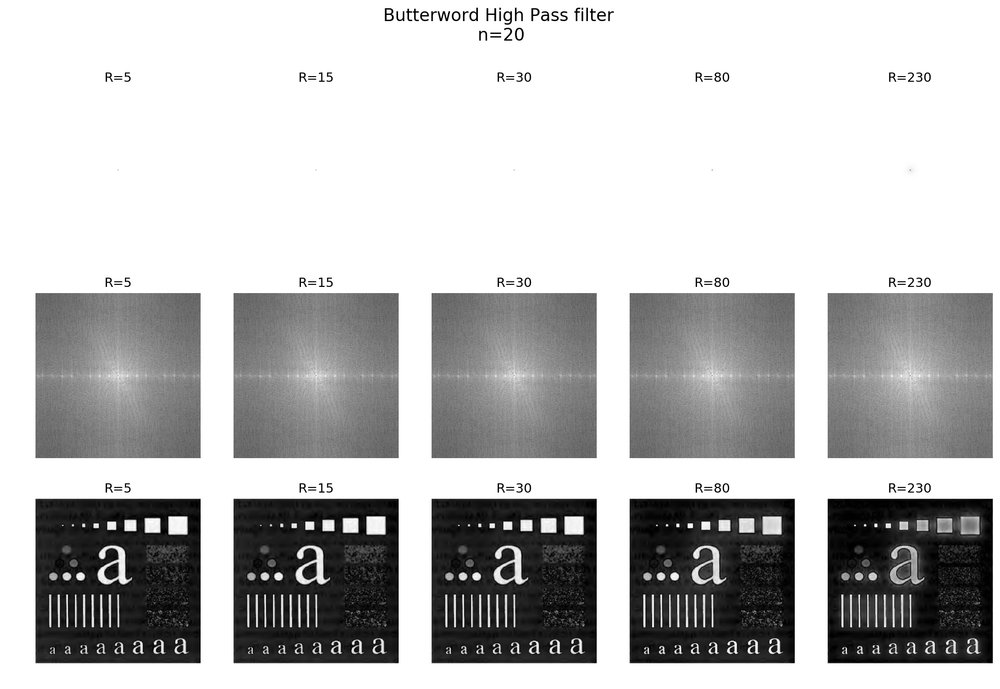

In [15]:
for i, n_batervort_filter in enumerate(n_batervort_filter_arr):
    images = []
    images = n_batervort_filter[0] + n_batervort_filter[1] + n_batervort_filter[2]
    show_applied_filter3x5(images, ['R=5','R=15','R=30','R=80','R=230'], 
                           fig_suptitle=f"Butterword High Pass filter\n n={n_arr[i]}")

# Gauss Low Pass filter

In [16]:
filter_arr_GLPF, spectrum_back_filter_arr_GLPF, img_back_filter_arr_GLPF = apply_filter([5, 15, 30, 80, 230], 
                                   image_transform.gauss_low_pass_filter)

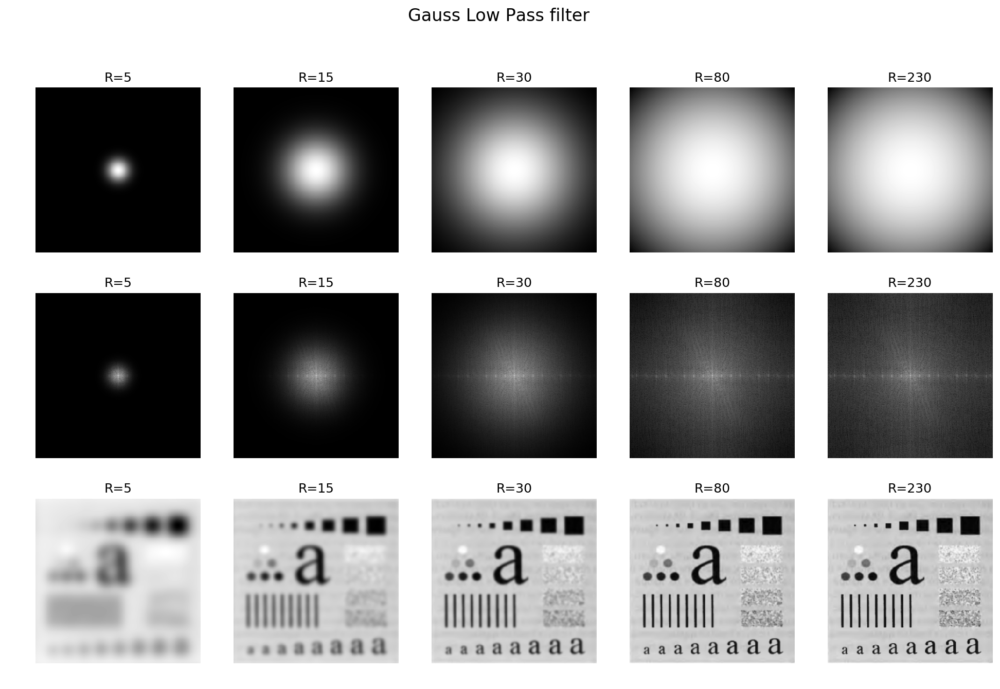

In [17]:
images = []
images = filter_arr_GLPF + spectrum_back_filter_arr_GLPF + img_back_filter_arr_GLPF
show_applied_filter3x5(images, ['R=5','R=15','R=30','R=80','R=230'], fig_suptitle='Gauss Low Pass filter')

# Gauss High Pass filter

In [18]:
filter_arr_GHPF, spectrum_back_filter_arr_GHPF, img_back_filter_arr_GHPF = apply_filter([5, 15, 30, 80, 230], 
                                   image_transform.gauss_high_pass_filter)

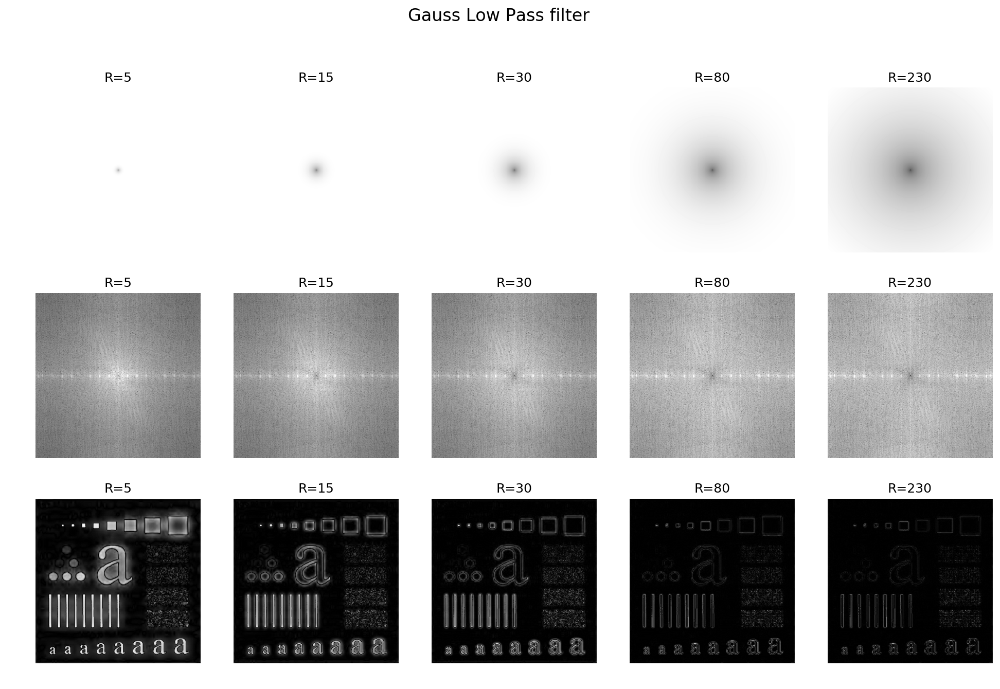

In [19]:
images = []
images = filter_arr_GHPF + spectrum_back_filter_arr_GHPF + img_back_filter_arr_GHPF
show_applied_filter3x5(images, ['R=5','R=15','R=30','R=80','R=230'], fig_suptitle='Gauss Low Pass filter')